In [196]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from connect_mongo import connect_to_mongo 

In [197]:
collections= ["fincaraiz", "properati", "metrocuadrado", "ciencuadras"]
df = connect_to_mongo("propiedades", collections)


In [198]:
# apply filters fo remove outliers and high values

collections= ["fincaraiz", "properati", "metrocuadrado", "ciencuadras"]
df = connect_to_mongo("propiedades", collections)
df = df[['area', 'technicalSheet_bathrooms','technicalSheet_bedrooms', 'technicalSheet_garage', 'antiquity', 'area_price_rent','technicalSheet_property_type_name', 'location_localidad', 'technicalSheet_stratum', 'location_longitude', 'location_latitude', 'costs_total_amount']]
df['costs_total_amount'] = df['costs_total_amount'] / 1_000_000
df = df[(df["area_price_rent"] <= 200000) & (df["area_price_rent"] >= 6000 )].reset_index(drop=True)
df = df[(df["costs_total_amount"] <= 30)].reset_index(drop=True)
df = df[(df["area"] <= 1500)].reset_index(drop=True)

In [199]:
# for complement the data introduces interes points as schools, hospitals, etc
import json


with open("datasets/puntos_interes.geojson", "r", encoding="utf-8") as archivo:
    geojson_data = json.load(archivo)
rows = []
for feature in geojson_data["features"]:
    row = feature["properties"]  # Extraer propiedades
    row["latitude"] = feature["geometry"]["coordinates"][1]  # Extraer latitud
    row["longitude"] = feature["geometry"]["coordinates"][0]  # Extraer longitud
    rows.append(row)

# Crear un DataFrame
interest_point_df = pd.DataFrame(rows)

In [200]:
interest_poin_types = interest_point_df.groupby('NGeClasifi').agg(
  
    conteo=('NGeClasifi', 'size')
).reset_index()
interest_poin_types

,NGeClasifi,conteo
0,AMBI,21
1,COM-IND-TURI,1443
2,CULT,1168
3,DEP-REC,5369
4,EDUC,2918
5,FUN-PUB,2054
6,SALUD,332
7,SEG-JUS,1280
8,TRANS,22
9,UNADM,11


In [201]:
equip_cat = interest_poin_types['NGeClasifi'].unique()

In [173]:
# calculates the distance between the location and interest point coordinades and add data the count of point in a radio of 500m
DISTANCIA_MAXIMA_KM = 0.5

def haversine(lat1, lon1, lat2, lon2):
    R = 6371 
    lat1, lon1, lat2, lon2 = map(np.radians, [lat1, lon1, lat2, lon2])
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    a = np.sin(dlat / 2) ** 2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon / 2) ** 2
    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1 - a))
    return R * c

conteos_categorias = []

for _, inmueble in df.iterrows():
    inmueble_coords = (inmueble['location_latitude'], inmueble['location_longitude'])
    
    # Calcular las distancias a todos los puntos de interés
    distancias = haversine(
        inmueble['location_latitude'], inmueble['location_longitude'],
        interest_point_df['latitude'].values, interest_point_df['longitude'].values
    )
    
    # Filtrar puntos cercanos dentro de la distancia máxima
    puntos_cercanos = interest_point_df[distancias <= DISTANCIA_MAXIMA_KM]
    
    # Contar las categorías de puntos cercanos
    conteo = puntos_cercanos['NGeClasifi'].value_counts().to_dict()
    
    # Agregar el conteo al diccionario
    conteos_categorias.append(conteo)

# Agregar la información al DataFrame de inmuebles
df['categorias_cercanas'] = conteos_categorias

# Visualizar el resultado

In [ ]:
#now we will create a score for join in a sum the interest point count and multiply a weight  
interest_point_cat_weight = {
    "AMBI": 0.8, "COM-IND-TURI": 0.4, "CULT": 0.5, "DEP-REC": 0.8, "EDUC": 0.7, "FUN-PUB": 0.6, "SALUD": 0.9, "SEG-JUS": 0.6, "TRANS": 0.7, "UNADM": 0.6
}
def calcular_puntaje(categorias_cercanas):
    if not categorias_cercanas:
        return 0
    
    return sum(categorias_cercanas.get(cat, 0) * interest_point_cat_weight.get(cat, 0) for cat in interest_point_cat_weight)

df['interest_point_score'] = df['categorias_cercanas'].apply(calcular_puntaje)

df

,area,technicalSheet_bathrooms,technicalSheet_bedrooms,technicalSheet_garage,antiquity,area_price_rent,technicalSheet_property_type_name,location_localidad,technicalSheet_stratum,location_longitude,location_latitude,costs_total_amount,categorias_cercanas,interest_point_score
0,54.00,1,2,0,8.0,22222.222222,Apartamento,otra,3,-74.081750,4.609710,1.200,"{'COM-IND-TURI': 15, 'FUN-PUB': 5, 'SEG-JUS': ...",19.0
1,43.00,1,1,0,12.0,27906.976744,Apartaestudio,chapinero,3,-74.064891,4.635444,1.200,"{'COM-IND-TURI': 21, 'EDUC': 20, 'SALUD': 5, '...",32.7
2,40.00,1,1,1,20.0,50000.000000,Apartamento,chapinero,4,-74.058861,4.642401,2.000,"{'DEP-REC': 17, 'CULT': 10, 'COM-IND-TURI': 6,...",27.1
3,61.05,1,3,1,42.0,34823.914824,Apartamento,suba,3,-74.064124,4.716938,2.126,"{'DEP-REC': 20, 'EDUC': 5, 'FUN-PUB': 3, 'COM-...",22.3
4,178.00,3,3,2,26.0,60674.157303,Apartamento,chapinero,6,-74.049904,4.654888,10.800,"{'DEP-REC': 12, 'COM-IND-TURI': 3, 'CULT': 3, ...",13.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8916,17.50,0,0,0,5,34285.714286,Local,chapinero,4,-74.065431,4.638473,0.600,"{'COM-IND-TURI': 29, 'EDUC': 17, 'FUN-PUB': 10...",37.9
8917,80.00,3,2,2,4,91800.000000,Apartamento,usaquén,6,-74.050132,4.696848,7.344,"{'COM-IND-TURI': 7, 'DEP-REC': 7, 'FUN-PUB': 2...",11.0
8918,55.00,1,1,0,2,18181.818182,Apartaestudio,teusaquillo,4,-74.079644,4.626397,1.000,"{'FUN-PUB': 19, 'CULT': 14, 'EDUC': 12, 'COM-I...",36.1
8919,37.00,1,1,0,30,39189.189189,Apartamento,teusaquillo,4,-74.069695,4.633167,1.450,"{'EDUC': 16, 'CULT': 12, 'COM-IND-TURI': 10, '...",35.9


Al detectarse muchos datos con bedrooms 0 en los cuales por logica no corresponde se decidio agragar datos

In [175]:

# def asignar_bedrooms(row):
#     if row['technicalSheet_bedrooms'] == 0: 
#         if row['technicalSheet_property_type_name'] == 'Local':
#             return 1
#         elif row['technicalSheet_property_type_name'] == 'Oficina':
#             return 3
#         elif row['technicalSheet_property_type_name'] == 'Apartamento':
#             return 3
#         elif row['technicalSheet_property_type_name'] == 'Casa':
#             return 4
#         elif row['technicalSheet_property_type_name'] == 'Apartaestudio':
#             return 2
#         elif row['technicalSheet_property_type_name'] == 'Edificio':
#             return 8
#     return row['technicalSheet_bedrooms'] 

# # Aplicamos la función a cada fila del DataFrame
# df['technicalSheet_bedrooms'] = df.apply(asignar_bedrooms, axis=1)

In [ ]:
relaciones_tipo_inmueble = df.groupby('technicalSheet_property_type_name').agg({
    'technicalSheet_bedrooms': 'mean',
    'technicalSheet_bathrooms': 'mean',
    'technicalSheet_garage': 'mean'
}).reset_index()

# Renombrar columnas para mayor claridad
relaciones_tipo_inmueble = relaciones_tipo_inmueble.rename(columns={
    'technicalSheet_bedrooms': 'promedio_bedrooms',
    'technicalSheet_bathrooms': 'promedio_bathrooms',
    'technicalSheet_garage': 'promedio_garages'
})

relaciones_tipo_inmueble

,technicalSheet_property_type_name,promedio_bedrooms,promedio_bathrooms,promedio_garages
0,Apartaestudio,1.034268,1.006231,0.542056
1,Apartamento,2.359054,2.128415,1.136581
2,Bodega,0.000000,3.323684,1.094737
3,Casa,4.712871,4.378713,2.398515
4,Casa campestre,5.666667,7.333333,9.000000
5,Consultorio,0.000000,2.469880,1.012048
6,Depósito,0.000000,1.000000,0.000000
7,Edificio,3.929577,7.746479,2.267606
8,Local,0.000000,2.055112,0.628716
9,Local Comercial,0.636364,2.136364,0.954545


In [177]:
bedrooms = df.groupby('technicalSheet_bedrooms')
bedrooms = df.groupby('technicalSheet_bedrooms').agg(
    precio_por_area_promedio=('area_price_rent', 'mean'),
    conteo=('technicalSheet_bedrooms', 'size')
).reset_index().sort_values(by='technicalSheet_bedrooms', ascending=True)

print(bedrooms)

    technicalSheet_bedrooms  precio_por_area_promedio  conteo
0                         0              60192.449647    3867
1                         1              57976.543624    1261
2                         2              41052.576816    1410
3                         3              39651.758449    1552
4                         4              35171.541682     468
5                         5              28036.524879     159
6                         6              28978.473547      73
7                         7              26060.461313      42
8                         8              25694.614854      21
9                         9              31415.656164      13
10                       10              31241.622561      11
11                       11              37882.397269       7
12                       12              28203.265237       8
13                       13              30830.436347       7
14                       14              22903.527160       6
15      

In [178]:


df['area_bathroom_ratio'] = df['area'] / (df['technicalSheet_bathrooms'] + 1)
df['area_bedroom_ratio'] = df['area'] / (df['technicalSheet_bedrooms'] + 1)
df = df.drop(columns=['technicalSheet_bathrooms', 'technicalSheet_bedrooms'])

In [179]:

print("\nEstadísticas de precios por metro cuadrado:")
print(df['area_price_rent'].describe())


Estadísticas de precios por metro cuadrado:
count      8921.000000
mean      50669.841121
std       29617.784510
min        6000.000000
25%       28698.412698
50%       43696.969697
75%       65306.122449
max      200000.000000
Name: area_price_rent, dtype: float64


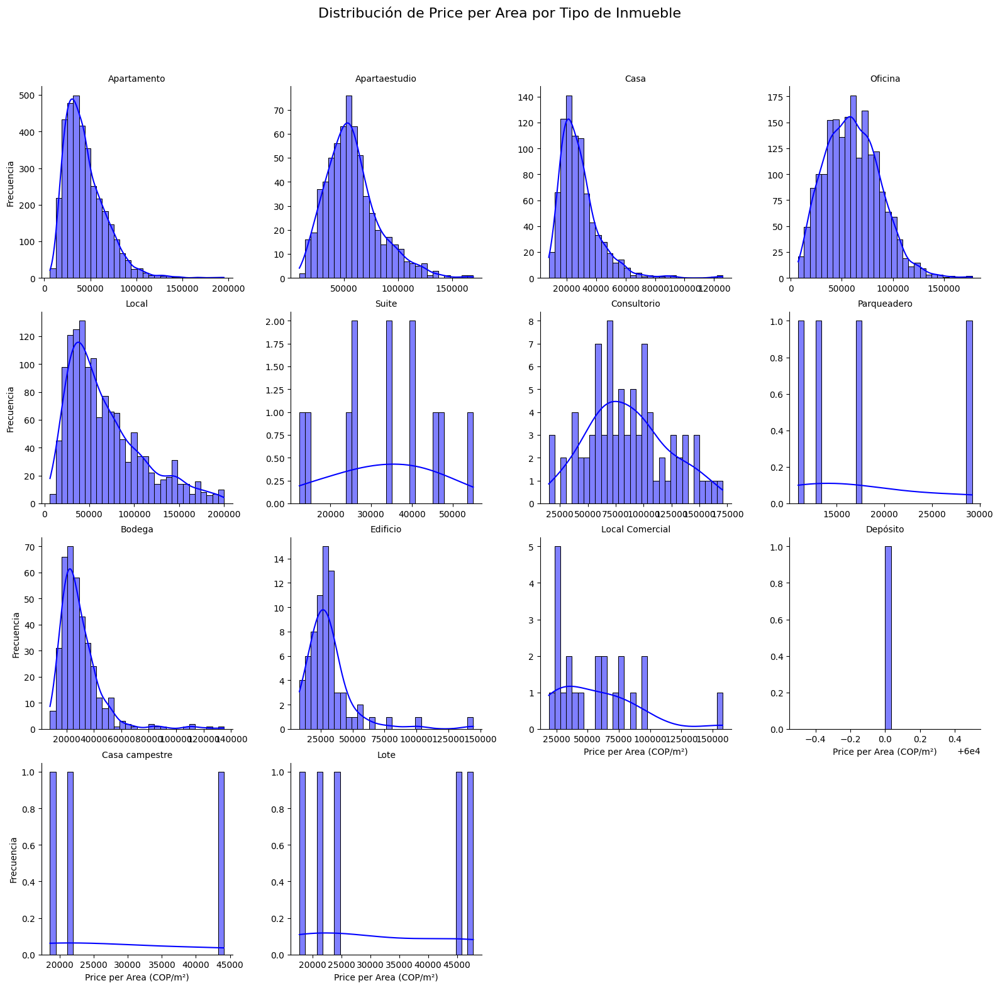

In [ ]:
g = sns.FacetGrid(df, col='technicalSheet_property_type_name', col_wrap=4, height=4, sharex=False, sharey=False)

# Dibujar los histogramas
g.map(sns.histplot, 'area_price_rent', bins=30, kde=True, color='blue')

# Configuración de los gráficos
g.set_titles("{col_name}")
g.set_axis_labels("Price per Area (COP/m²)", "Frecuencia")
g.figure.subplots_adjust(top=0.9)
g.figure.suptitle("Distribución de Price per Area por Tipo de Inmueble", fontsize=16)
#g.set_xticklabels(rotation=45)
# Mostrar los gráficos
plt.show()

In [181]:
if 'technicalSheet_property_type_name' in df.columns:
    print("\nTipo de inmuebles:")
    print(df['technicalSheet_property_type_name'].value_counts())


Tipo de inmuebles:
technicalSheet_property_type_name
Apartamento        3551
Oficina            1960
Local              1379
Casa                808
Apartaestudio       642
Bodega              380
Consultorio          83
Edificio             71
Local Comercial      22
Suite                12
Lote                  5
Parqueadero           4
Casa campestre        3
Depósito              1
Name: count, dtype: int64


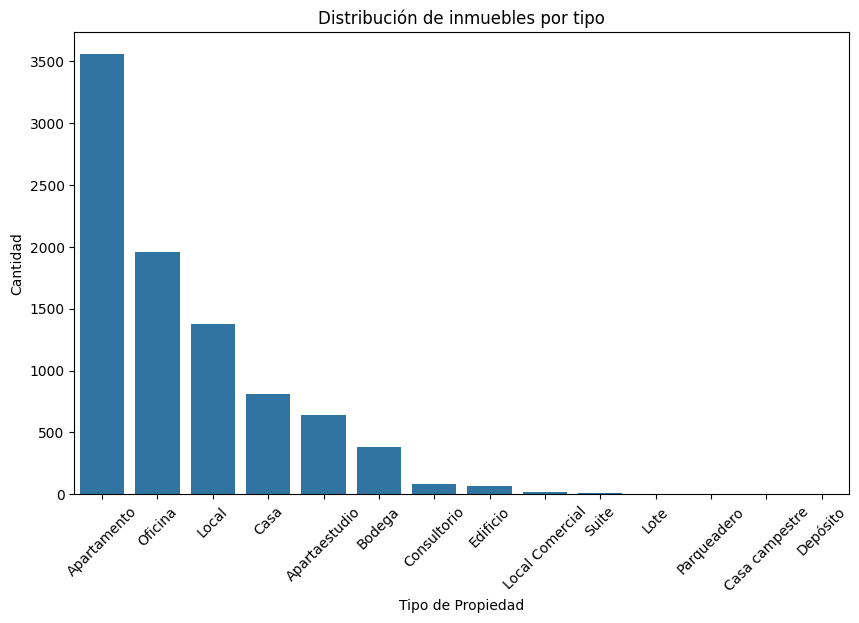

In [ ]:
if 'technicalSheet_property_type_name' in df.columns:
    plt.figure(figsize=(10, 6))
    sns.countplot(data=df, x='technicalSheet_property_type_name', order=df['technicalSheet_property_type_name'].value_counts().index)
    plt.title('Distribución de inmuebles por tipo')
    plt.xlabel('Tipo de Propiedad')
    plt.ylabel('Cantidad')
    plt.xticks(rotation=45)
    plt.show()

In [183]:
if 'location_localidad' in df.columns:
    print("\nInmuebles por localidad:")
    print(df['location_localidad'].value_counts())


Inmuebles por localidad:
location_localidad
chapinero             2047
usaquén               1617
suba                  1140
engativá               558
fontibón               546
barrios unidos         514
teusaquillo            505
santa fe               470
kennedy                366
puente aranda          255
los mártires           179
otra                   161
antonio nariño         117
la candelaria          115
bosa                    88
rafael uribe uribe      88
ciudad bolívar          84
usme                    39
san cristóbal           32
Name: count, dtype: int64


In [184]:

promedios_por_localidad = df.groupby('location_localidad').agg({
    'area': 'mean',  
    'area_price_rent': 'mean'
}).reset_index().sort_values(by='area_price_rent', ascending=False) 
promedios_por_localidad = promedios_por_localidad.rename(columns={
    'area': 'area_promedio',    
    'area_price_rent': 'precio_por_area_promedio'
})

print(promedios_por_localidad)

    location_localidad  area_promedio  precio_por_area_promedio
3            chapinero     141.770523              67382.929715
17             usaquén     143.587217              55521.682993
14            santa fe     122.437787              54612.546531
1       barrios unidos     161.895000              49776.522078
10                otra     190.855217              49474.934044
4       ciudad bolívar     115.516905              48147.355111
16         teusaquillo     156.902475              46825.216829
15                suba     133.804474              44266.563908
6             fontibón     126.462125              44117.594819
18                usme      76.395897              43778.146002
9         los mártires      94.513184              43362.801847
0       antonio nariño     155.863077              41757.033313
8        la candelaria     152.324783              40689.784702
5             engativá     140.097276              32639.944283
11       puente aranda     184.027608   

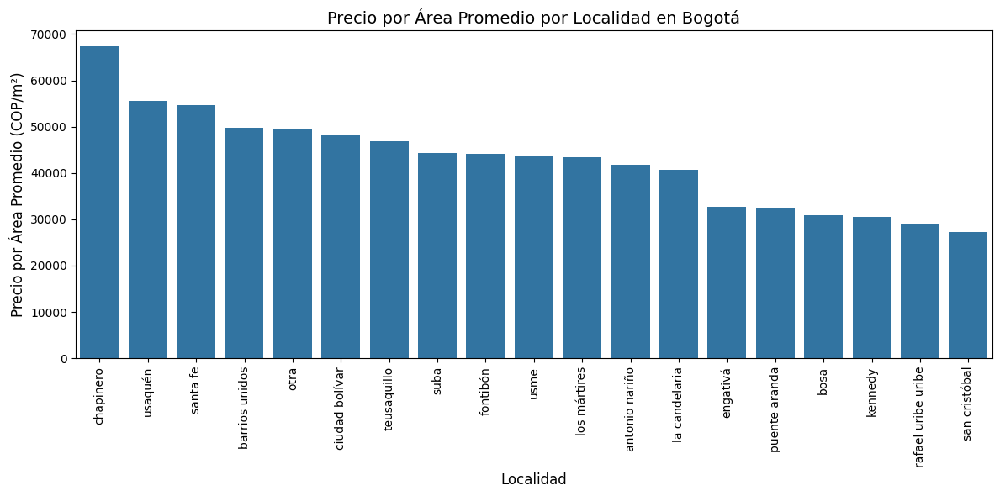

In [ ]:
plt.figure(figsize=(12, 6))
sns.barplot(data=promedios_por_localidad, x='location_localidad', y='precio_por_area_promedio')

plt.title('Precio por Área Promedio por Localidad en Bogotá', fontsize=14)
plt.xlabel('Localidad', fontsize=12)
plt.ylabel('Precio por Área Promedio (COP/m²)', fontsize=12)
plt.xticks(rotation=90) 

plt.tight_layout()
plt.show()

In [186]:
stratum_order = ['1', '2', '3', '4', '5', '6']
df['technicalSheet_stratum'] = pd.Categorical(
    df['technicalSheet_stratum'],
    categories=stratum_order,
    ordered=True
)

In [ ]:
promedios_por_stratum = df.groupby('technicalSheet_stratum').agg(
    area_promedio=('area', 'mean'),
    precio_por_area_promedio=('area_price_rent', 'mean'),
    conteo=('technicalSheet_stratum', 'size')
).reset_index().sort_values(by='precio_por_area_promedio', ascending=False)

print(promedios_por_stratum)

  technicalSheet_stratum  area_promedio  precio_por_area_promedio  conteo
5                      6     175.243740              66289.752942    1853
4                      5     133.857298              62035.306850    1299
3                      4     130.654531              49101.892935    2205
0                      1     195.271800              48451.672011      50
2                      3     126.724675              39302.818475    2999
1                      2      79.600000              29060.765608     360


/tmp/ipykernel_8504/2061454439.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  promedios_por_stratum = df.groupby('technicalSheet_stratum').agg(


- se descubre una relacion entre el estrato y el precio por area, es extraño ver que el estrato 1 no sigue la tendencia, puede deberse a la ubicacion especifica de los predios o un error en los datos

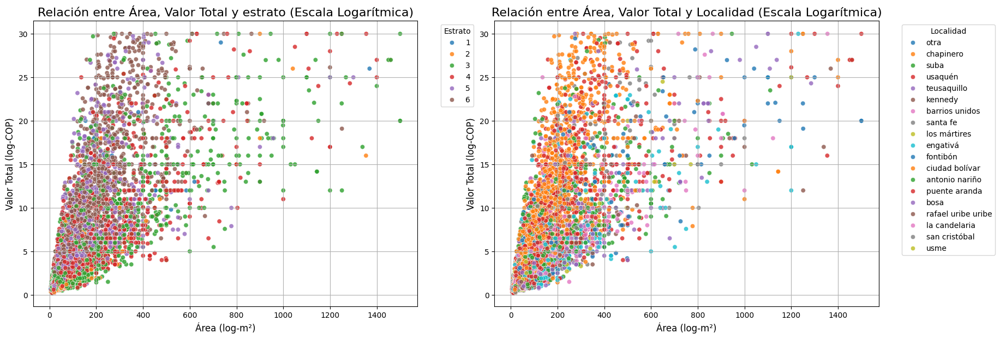

In [ ]:
if 'area' in df.columns and 'costs_total_amount' in df.columns and 'technicalSheet_stratum' in df.columns:
    df_filtered = df[['area', 'costs_total_amount', 'technicalSheet_stratum', ]].dropna()
    plt.figure(figsize=(20, 15))

    plt.subplot(2, 2, 1)
    sns.scatterplot(
    data=df,
    x='area',
    y='costs_total_amount',
    hue='technicalSheet_stratum',
    palette='tab10',
    alpha=0.8
)
    plt.title('Relación entre Área, Valor Total y estrato (Escala Logarítmica)', fontsize=16)
    plt.xlabel('Área (log-m²)', fontsize=12)
    plt.ylabel('Valor Total (log-COP)', fontsize=12)
    plt.legend(title='Estrato', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True)
    

   

    plt.subplot(2, 2, 2)
    sns.scatterplot(
    data=df,
    x='area',
    y='costs_total_amount',
    hue='location_localidad',
    palette='tab10',
    alpha=0.8
)

   
    plt.title('Relación entre Área, Valor Total y Localidad (Escala Logarítmica)', fontsize=16)
    plt.xlabel('Área (log-m²)', fontsize=12)
    plt.ylabel('Valor Total (log-COP)', fontsize=12)
    plt.legend(title='Localidad', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True)
    plt.show()
else:
    print("Faltan columnas necesarias ('area', 'costs_total_amount', 'location_localidad') para la gráfica.")

In [ ]:
import folium
from folium.plugins import MarkerCluster


# Filtrar los datos necesarios
columns = ['latitude', 'longitude', 'price_per_area']
filtered_data = df[['location_latitude', 'location_longitude', 'area_price_rent']].dropna()
filtered_data.columns = columns  


map_bogota = folium.Map(location=[4.65, -74.1], zoom_start=11)

marker_cluster = MarkerCluster().add_to(map_bogota)


for _, row in filtered_data.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=5,
        color='blue',
        fill=True,
        fill_color='blue',
        fill_opacity=0.7,
        tooltip=f"Precio/Área: {row['price_per_area']:.2f}"
    ).add_to(marker_cluster)

map_bogota

/tmp/ipykernel_8504/1165545271.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


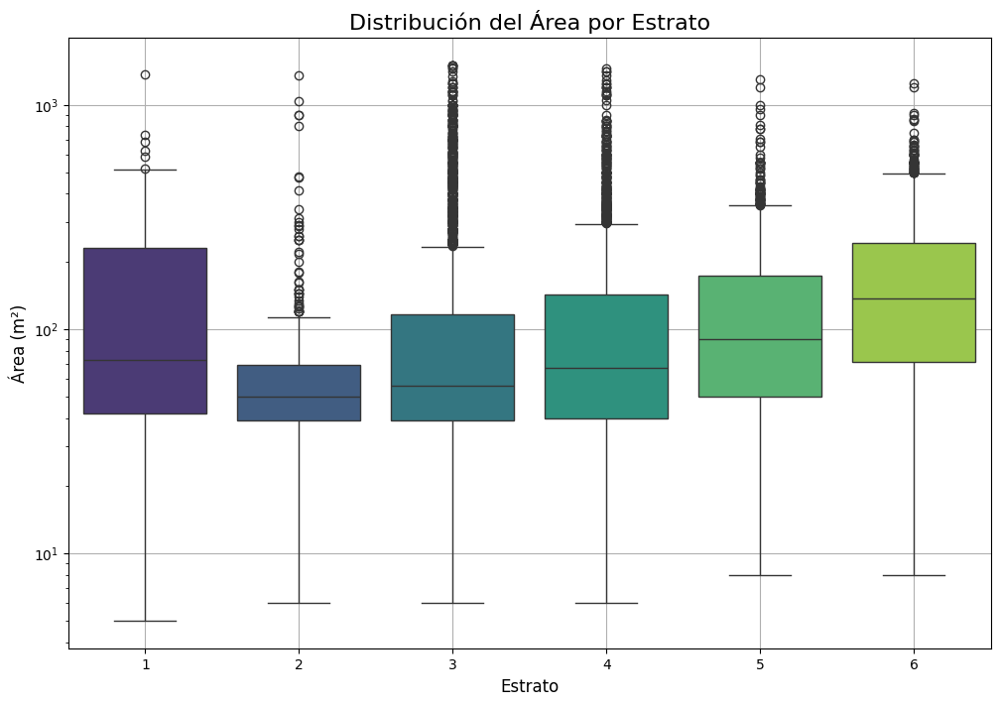

In [ ]:
if 'area' in df.columns and 'costs_total_amount' in df.columns and 'technicalSheet_stratum' in df.columns:
    df_filtered = df[['area', 'costs_total_amount', 'technicalSheet_stratum']].dropna()

    plt.figure(figsize=(12, 8))
    sns.boxplot(
    data=df_filtered,
    x='technicalSheet_stratum',
    y='area',
    palette='viridis'
)
    
    plt.yscale('log')
    plt.title('Distribución del Área por Estrato', fontsize=16)
    plt.xlabel('Estrato', fontsize=12)
    plt.ylabel('Área (m²)', fontsize=12)
    plt.grid(True)
    plt.show()
else:
    print("Faltan columnas necesarias ('area', 'costs_total_amount', 'technicalSheet_stratum') para la gráfica.")

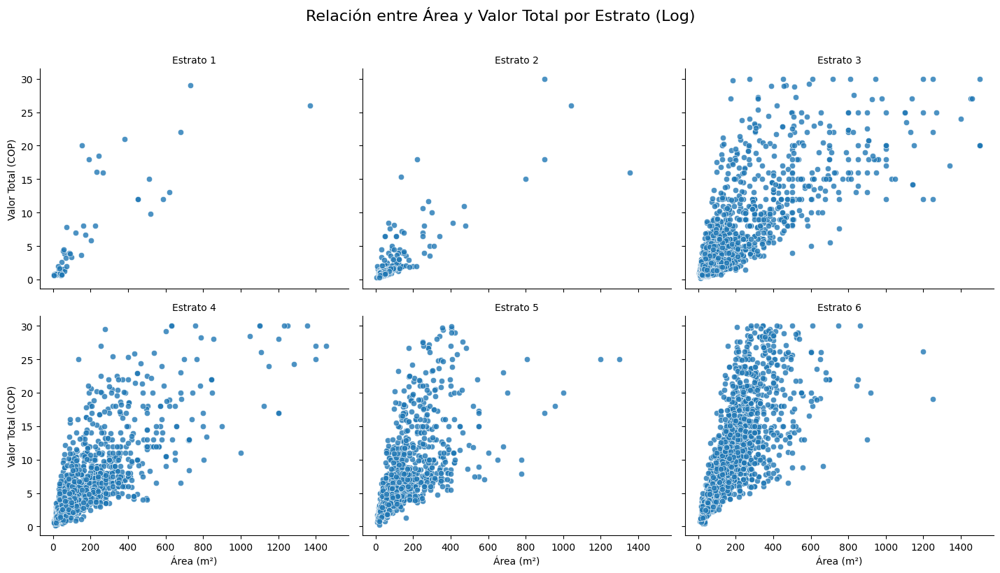

In [ ]:
if 'area' in df.columns and 'costs_total_amount' in df.columns and 'technicalSheet_stratum' in df.columns:
    df_filtered = df[['area', 'costs_total_amount', 'technicalSheet_stratum']].dropna()
    g = sns.FacetGrid(df_filtered, col="technicalSheet_stratum", col_wrap=3, height=4, aspect=1.2)
    g.map(sns.scatterplot, "area", "costs_total_amount", alpha=0.8)
    g.set_axis_labels("Área (m²)", "Valor Total (COP)")
    g.set_titles("Estrato {col_name}")
    g.figure.suptitle("Relación entre Área y Valor Total por Estrato (Log)", fontsize=16, y=1.02)
    g.tight_layout()
 
    plt.show()
else:
    print("Faltan columnas necesarias ('area', 'costs_total_amount', 'technicalSheet_stratum') para la gráfica.")

/tmp/ipykernel_8504/2009300184.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


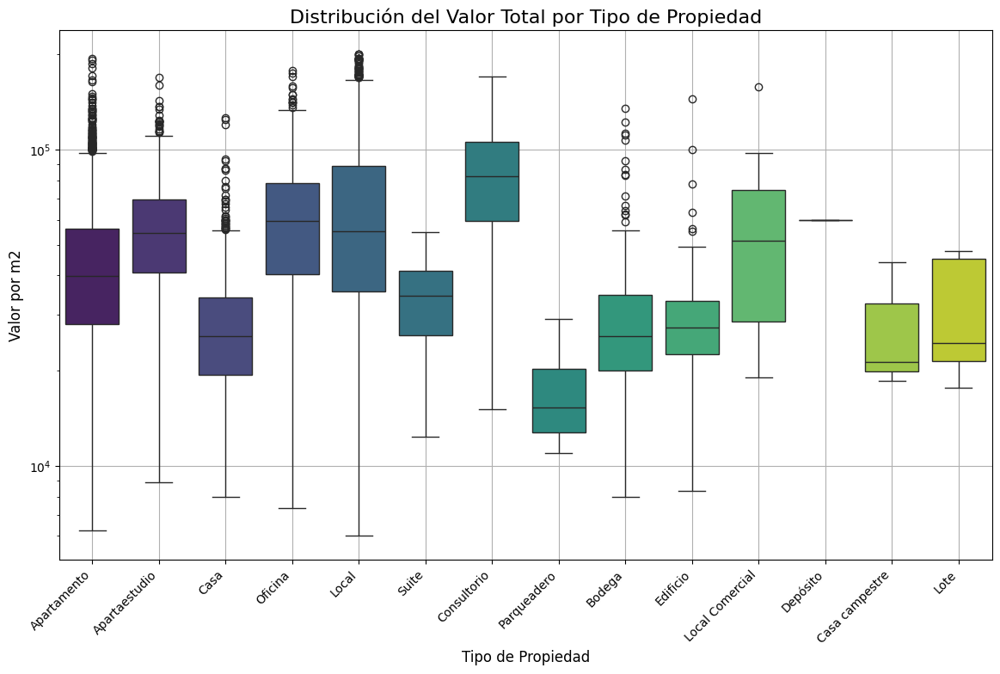

In [ ]:

plt.figure(figsize=(14, 8))

# Create the box plot
sns.boxplot(
    data=df,
    x='technicalSheet_property_type_name',  # Replace with your actual column name for property type
    y='area_price_rent',  # Replace with your total amount column
    palette='viridis'
)

# Set titles and labels
 
plt.yscale('log')
plt.title('Distribución del Valor Total por Tipo de Propiedad', fontsize=16)
plt.xlabel('Tipo de Propiedad', fontsize=12)
plt.ylabel('Valor por m2', fontsize=12)
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.grid(True)
plt.show()

In [193]:
unique_property_types = df['technicalSheet_property_type_name'].unique()

# Mostrar los valores únicos
print("Valores únicos de 'technicalSheet_property_type_name':")
print(unique_property_types)

Valores únicos de 'technicalSheet_property_type_name':
['Apartamento' 'Apartaestudio' 'Casa' 'Oficina' 'Local' 'Suite'
 'Consultorio' 'Parqueadero' 'Bodega' 'Edificio' 'Local Comercial'
 'Depósito' 'Casa campestre' 'Lote']


/home/sag/Documents/pythonProjects/arriendo_bogota_notebook/venv/lib/python3.12/site-packages/seaborn/matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
/home/sag/Documents/pythonProjects/arriendo_bogota_notebook/venv/lib/python3.12/site-packages/seaborn/matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)


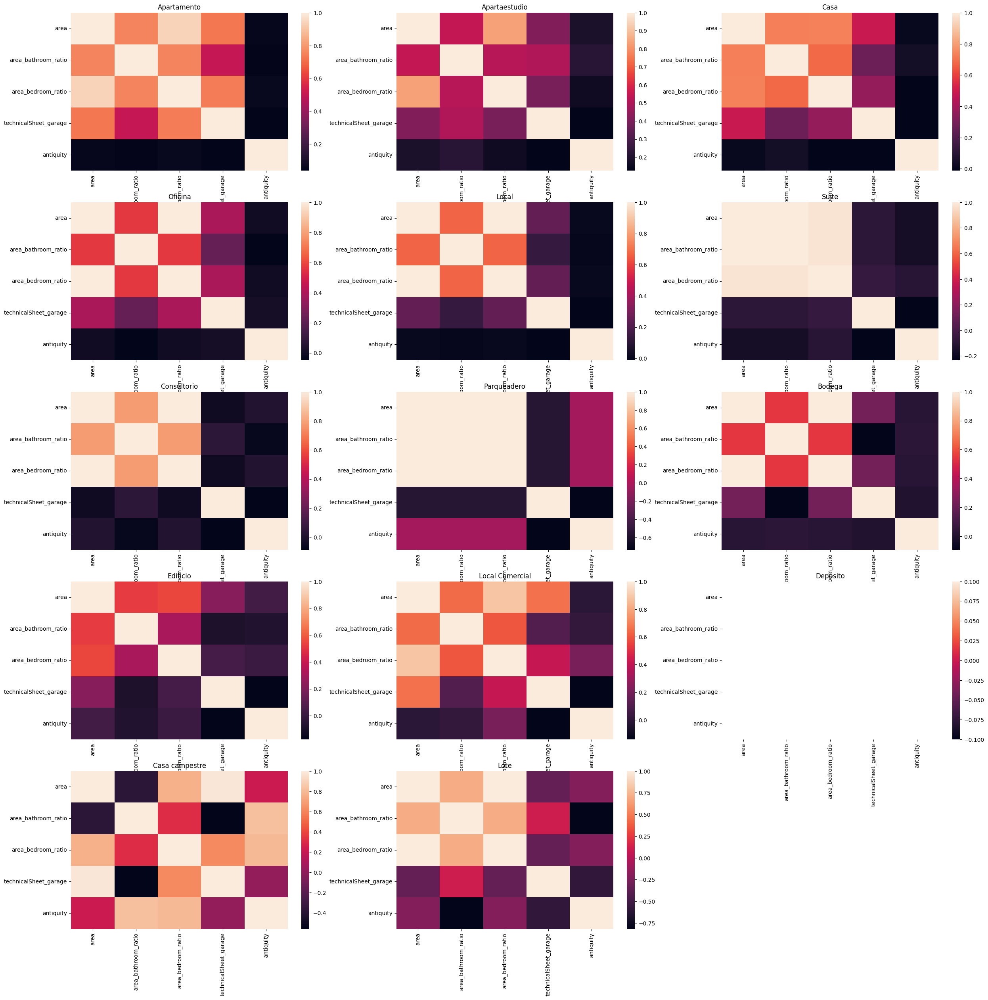

In [195]:
property_type_filter = ['Apartamento', 'Apartaestudio', 'Casa', 'Oficina', 'Local', 'Suite',
 'Consultorio', 'Parqueadero', 'Bodega', 'Edificio', 'Local Comercial',
 'Depósito', 'Casa campestre', 'Lote']

plt.figure(figsize=(30,30))
for i, pt in enumerate(property_type_filter): 
    filtered_df = df[df['technicalSheet_property_type_name'] == pt]

    # Selección de columnas específicas
    selected_columns = ['area', 'area_bathroom_ratio', 'area_bedroom_ratio', 'technicalSheet_garage', 'antiquity']
    filtered_columns_df = filtered_df[selected_columns]

    corr = filtered_columns_df.corr()
    plt.subplot(5, 3, i+1)
    plt.title(pt)
    fig = sns.heatmap(corr, 
                xticklabels=corr.columns.values,
                yticklabels=corr.columns.values)

    #fig.get_figure().savefig("corr_heatmap.png", bbox_inches="tight") 

In [149]:
from sklearn.cluster import KMeans
df = df[(df["location_longitude"] > -74.3) & (df["location_latitude"] < 5)].reset_index(drop=True)
coords = df[['location_latitude', 'location_longitude']]

kmeans = KMeans(n_clusters=10, random_state=42) 
df['geo_cluster'] = kmeans.fit_predict(coords)

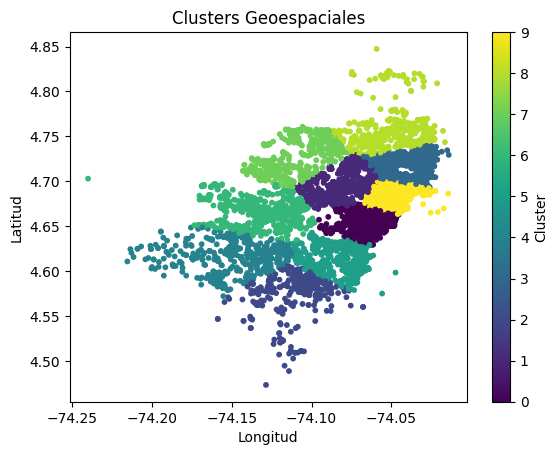

In [ ]:
plt.scatter(df['location_longitude'], df['location_latitude'], c=df['geo_cluster'], cmap='viridis', s=10)
plt.colorbar(label='Cluster')
plt.title('Clusters Geoespaciales')
plt.xlabel('Longitud')
plt.ylabel('Latitud')
plt.show()

- se decidio agrupar los tipos de inmueble debido que algunas tienen pocos datos

In [151]:
category_mapping = {
    'Apartamento': 'Residencial',
    'Apartaestudio': 'Residencial',
    'Casa': 'Residencial',
    'Casa campestre': 'Residencial',
    'Local Comercial': 'Comercial',
    'Oficina': 'Comercial',
    'Local': 'Comercial',
    'Bodega': 'Comercial',
    'Consultorio': 'Comercial',
    'Lote': 'Comercial',
    'Edificio': 'Edificio',
    'Parqueadero': 'Otros',
    'Depósito': 'Otros'
}
df = df[(df['technicalSheet_property_type_name'] != 'Suite')]
df['property_category'] = df['technicalSheet_property_type_name'].map(category_mapping) 

- Ahora se pasan a datos numericos para facilitar el analisis

In [152]:
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
df['property_category_encoded'] = label_encoder.fit_transform(df['property_category'])
category_mapping = {category: index for index, category in enumerate(label_encoder.classes_)}
print("Categorías y su número asignado:", category_mapping)

Categorías y su número asignado: {'Comercial': 0, 'Edificio': 1, 'Otros': 2, 'Residencial': 3}


In [153]:
abel_encoder = LabelEncoder()
df['location_localidad_encoded'] = label_encoder.fit_transform(df['location_localidad'])
category_mapping = {category: index for index, category in enumerate(label_encoder.classes_)}
print("Categorías y su número asignado:", category_mapping)

Categorías y su número asignado: {'antonio nariño': 0, 'barrios unidos': 1, 'bosa': 2, 'chapinero': 3, 'ciudad bolívar': 4, 'engativá': 5, 'fontibón': 6, 'kennedy': 7, 'la candelaria': 8, 'los mártires': 9, 'otra': 10, 'puente aranda': 11, 'rafael uribe uribe': 12, 'san cristóbal': 13, 'santa fe': 14, 'suba': 15, 'teusaquillo': 16, 'usaquén': 17, 'usme': 18}


In [154]:
colums_to_drop = ["costs_total_amount", "technicalSheet_property_type_name", "technicalSheet_stratum", 'property_category', 'location_localidad', 'area_price_rent', "categorias_cercanas", 'location_latitude','location_longitude']


In [ ]:
X = df.drop(columns=['costs_total_amount']+colums_to_drop)
y = df['costs_total_amount']

In [156]:
print(X.keys())

Index(['area', 'technicalSheet_bathrooms', 'technicalSheet_bedrooms',
       'technicalSheet_garage', 'antiquity', 'interest_point_score',
       'geo_cluster', 'property_category_encoded',
       'location_localidad_encoded'],
      dtype='object')


In [157]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [158]:
model = RandomForestRegressor(max_depth=26, n_estimators=38, random_state=0)

model.fit(X_train, y_train)

RandomForestRegressor(max_depth=26, n_estimators=38, random_state=0)

In [159]:
y_pred = model.predict(X_test)
print("Random Forest R-squared: {}".format(model.score(X_test, y_test)))

Random Forest R-squared: 0.7941899137678199


In [160]:
from sklearn.metrics import mean_squared_error

forest_mse = mean_squared_error(y_pred, y_test)
forest_rmse = np.sqrt(forest_mse)
print("Random Forest Regression RMSE: {}".format(forest_rmse))

Random Forest Regression RMSE: 2.887205511498062


In [161]:
# calculate mean absolute error (MAE)
from sklearn.metrics import mean_absolute_error

forest_mae = mean_absolute_error(y_pred, y_test)
print("Random Forest Regression MAE: {}".format(forest_mae))

Random Forest Regression MAE: 1.6846543414233648


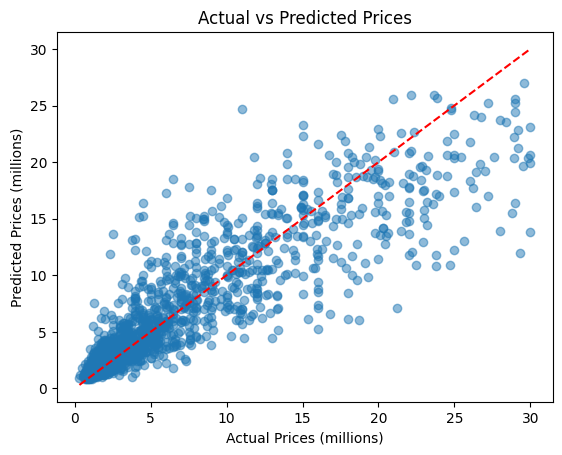

In [162]:
plt.scatter(y_test, y_pred, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], '--r')
plt.xlabel('Actual Prices (millions)')
plt.ylabel('Predicted Prices (millions)')
plt.title('Actual vs Predicted Prices')
plt.show()

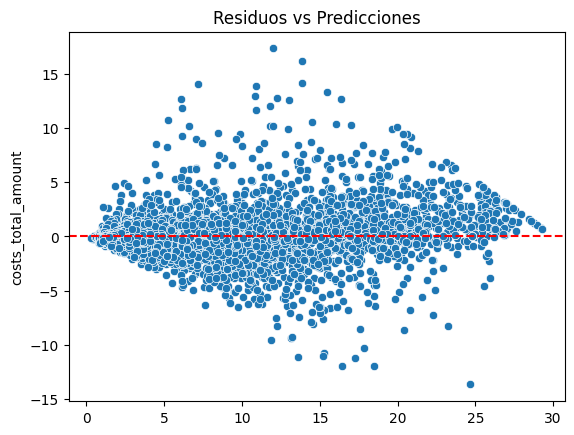

In [163]:
residuals = y - model.predict(X)
sns.scatterplot(x=model.predict(X), y=residuals)
plt.axhline(y=0, color='r', linestyle='--')
plt.title('Residuos vs Predicciones')
plt.show()

In [164]:
import joblib
joblib.dump(model, 'price_prediction_model.pkl')

['price_prediction_model.pkl']

In [ ]:
loaded_model = joblib.load('price_prediction_model.pkl')
print("Modelo cargado exitosamente.")
new_data = pd.DataFrame({
    'area': [500],
    #'technicalSheet_property_type_name': ['Casa'],
    #'technicalSheet_property_type_name_encoded': [3],
    #'property_category': 'Residencial',
    #'price_per_area':((70000000/40))/10000,
    'technicalSheet_bathrooms': [1],
    'technicalSheet_bedrooms': [3],
    'technicalSheet_garage': [4],
    'antiquity': [0],
    'property_category_encoded': [1],
    #'location_localidad_encoded': [4],
    #'location_localidad': ['usme'],
    'location_latitude': [4.6167, ],
    #'technicalSheet_property_type_name_encoded': [3],
    #'zona': 'Sur',
    'location_longitude': -74.1833,
    
})
new_coords = new_data[['location_latitude', 'location_longitude']]
new_data = new_data.drop(columns=['location_latitude', 'location_longitude'])
new_data['geo_cluster'] = kmeans.predict(new_coords)

predicted_price = loaded_model.predict(new_data)

print(f"El precio estimado para el inmueble es: {(predicted_price[0])} millones de pesos.")

Modelo cargado exitosamente.


ValueError: The feature names should match those that were passed during fit.
Feature names seen at fit time, yet now missing:
- interest_point_score
- location_localidad_encoded
